In [1]:
# Import library yang dibutuhkan
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [2]:
# 1. Problem Research
# Misalkan kita ingin memprediksi kolom 'TARGET'

# 2. Data Pre-Processing
# Membaca data dari file CSV
file_path_application_train = 'C:/Users/muhak/Downloads/Documents/application_train.csv'
df = pd.read_csv(file_path_application_train)

In [3]:
df.head(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [4]:
df.info(122)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

In [5]:
kolom_yang_dihapus = ['REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION','REG_REGION_NOT_WORK_REGION','LIVE_REGION_NOT_WORK_REGION','LIVE_CITY_NOT_WORK_CITY','FLAG_DOCUMENT_2','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_7','FLAG_DOCUMENT_10','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_16','FLAG_DOCUMENT_18','FLAG_DOCUMENT_21']

In [6]:
df = df.drop(columns=kolom_yang_dihapus)

In [7]:
df.info()
df.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 106 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(25), object(16)
memory usage: 248.7+ MB


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_11,FLAG_DOCUMENT_15,FLAG_DOCUMENT_17,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,WEDNESDAY,10,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,1,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,MONDAY,11,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,1,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,MONDAY,9,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,WEDNESDAY,17,0,0,Business Entity Type 3,NaN,0

In [8]:
df_filtered = df[ (df['REGION_RATING_CLIENT'] == 3)]

In [9]:
print(df_filtered['TARGET'].describe())

count    48330.000000
mean         0.111028
std          0.314170
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: TARGET, dtype: float64


In [10]:
df_filtered

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_11,FLAG_DOCUMENT_15,FLAG_DOCUMENT_17,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
7,100010,0,Cash loans,M,Y,Y,0,360000.0,1530000.0,42075.0,1530000.0,Unaccompanied,State servant,Higher education,Married,House / apartment,0.003122,-18850,-449,-4597.0,-2379,8.0,1,1,1,1,0,0,Managers,2.0,3,MONDAY,16,0,1,Other,NaN,0.714279,0.540654,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-1070.0,1,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
15,100019,0,Cash loans,M,Y,Y,0,157500.0,299772.0,20160.0,247500.0,Family,Working,Secondary / secondary special,Single / not married,Rented apartment,0.020713,-8728,-1157,-3494.0,-1368,17.0,1,1,0,1,0,0,Laborers,1.0,3,SATURDAY,6,1,1,Business Entity Type 2,0.115634,0.346634,0.678568,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-925.0,0,0,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
22,100026,0,Cash loans,F,N,N,1,450000.0,497520.0,32521.5,450000.0,Unaccompanied,Working,Secondary / secondary special,Married,Rented apartment,0.020713,-11146,-4306,-114.0,-2518,NaN,1,1,0,1,0,0,Sales staff,3.0,3,THURSDAY,6,0,0,Self-employed,NaN,0.457143,0.358951,0.0907,0.0795,0.9786,0.7076,0.0120,0.00,0.2069,0.1667,0.2083,0.0898,0.0723,0.0873,0.0077,0.0044,0.0924,0.0825,0.9786,0.7190,0.0121,0.0000,0.2069,0.1667,0.2083,0.0918,0.0790,0.0910,0.0078,0.0047,0.0916,0.0795,0.9786,0.7115,0.0120,0.00,0.2069,0.1667,0.2083,0.0913,0.0735,0.0889,0.0078,0.0045,reg oper account,block of flats,0.0696,Panel,No,0.0,0.0,0.0,0.0,-468.0,1,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
23,100027,0,Cash loans,F,N,Y,0,83250.0,239850.0,23850.0,225000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.006296,-24827,365243,-9012.0,-3684,NaN,1,0,0,1,1,0,NaN,2.0,3,FRIDAY,12,0,0,XNA,NaN,0.624305,0.669057,0.1443,0.0848,0.9876,0.8300,0.1064,0.14,0.1207,0.3750,0.4167,0.2371,0.1173,0.1484,0.0019,0.0007,0.1261,0.0754,0.9876,0.8367,0.0000,0.1208,0.1034,0.3750,0.4167,0.2425,0

In [11]:
# Mengisi nilai kosong dengan 0
df_filtered = df_filtered.fillna(0)

In [12]:
# Melakukan encoding untuk data kategorikal
df_filtered = pd.get_dummies(df_filtered)

In [13]:
# Melakukan feature selection berdasarkan korelasi dengan target
correlations = df_filtered.corr()['TARGET'].sort_values()
features = correlations[correlations > 0.01].index

In [14]:
# Memisahkan fitur dan target
X = df_filtered[features].drop('TARGET', axis=1)
y = df_filtered['TARGET']

In [15]:
# Membagi data menjadi data training dan testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [16]:
# Melakukan standardisasi data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [17]:
kolom = 'TARGET'

Text(0.5, 1.0, 'Data Awal')

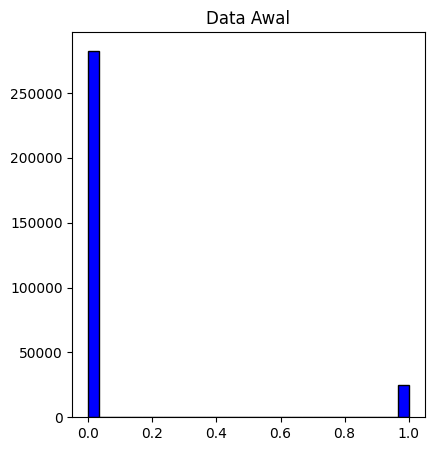

In [18]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.hist(df[kolom], bins=30, color='blue', edgecolor='black')
plt.title('Data Awal')

In [19]:
df_filtered[kolom] = df_filtered[kolom].fillna(0)

In [20]:
scaler = StandardScaler()
df_filtered[kolom] = scaler.fit_transform(df_filtered[[kolom]])

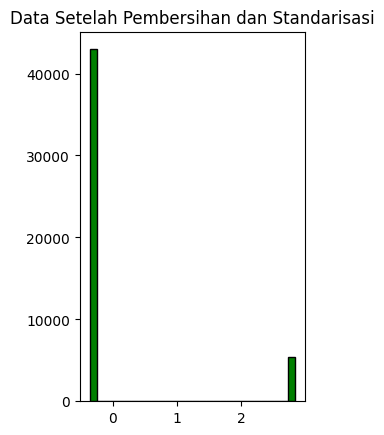

In [21]:
plt.subplot(1, 2, 2)
plt.hist(df_filtered[kolom], bins=30, color='green', edgecolor='black')
plt.title('Data Setelah Pembersihan dan Standarisasi')

plt.show()

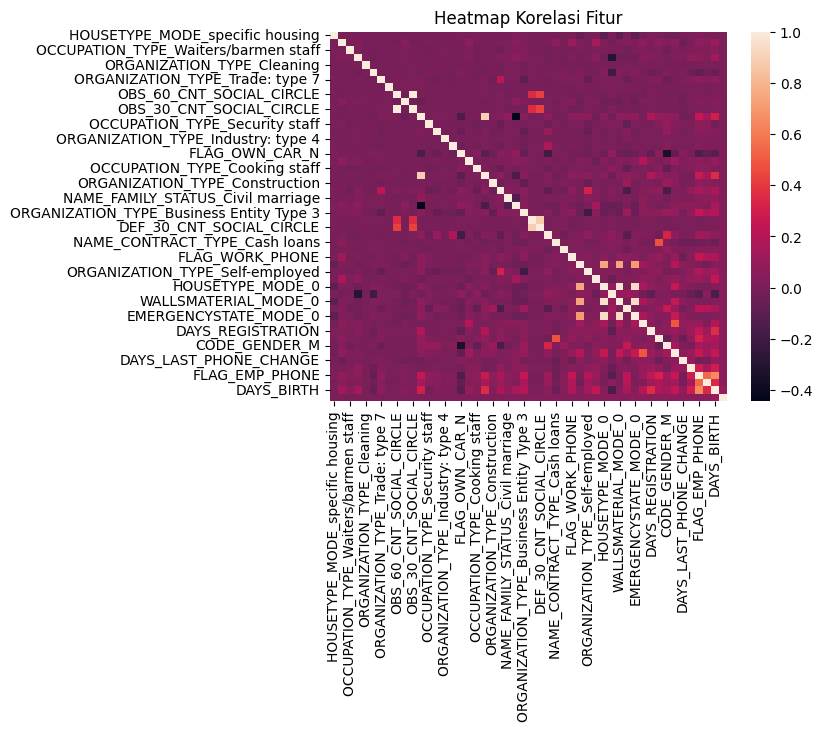

In [22]:
# 3. Data Visualization and Business Insight
# Misalkan kita ingin melihat korelasi antara fitur-fitur
corr = df_filtered[features].corr()
sns.heatmap(corr)
plt.title('Heatmap Korelasi Fitur')
plt.show()

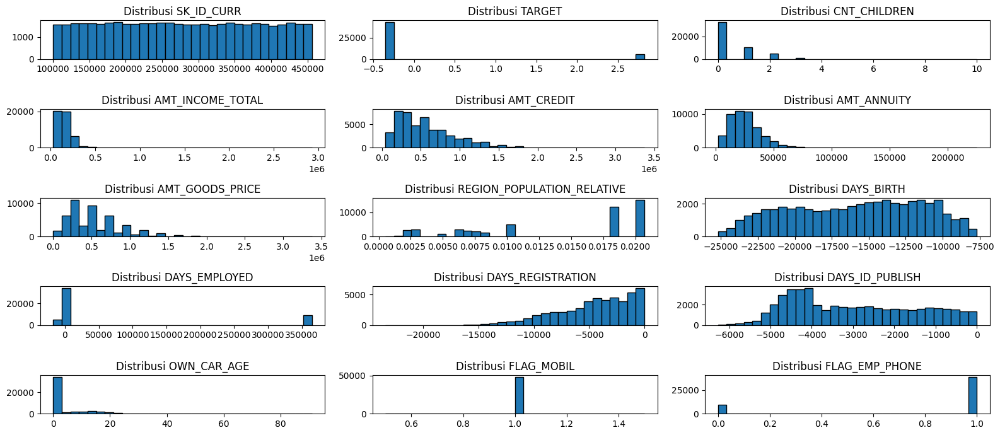

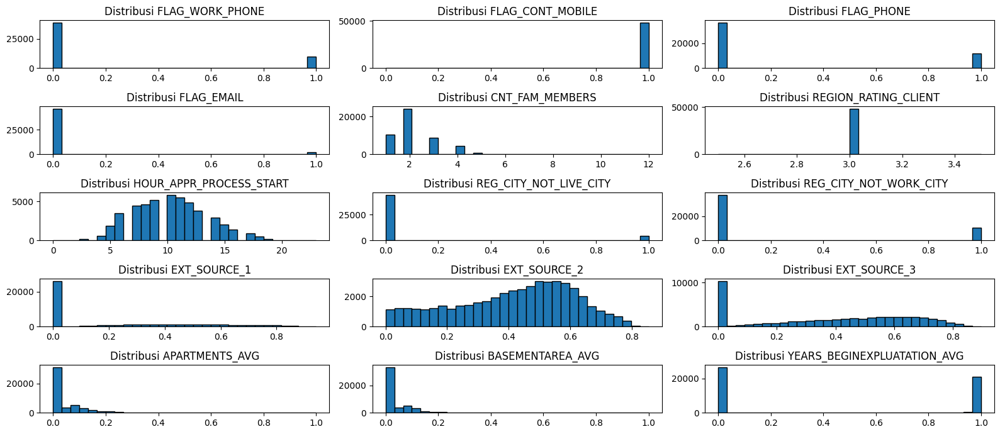

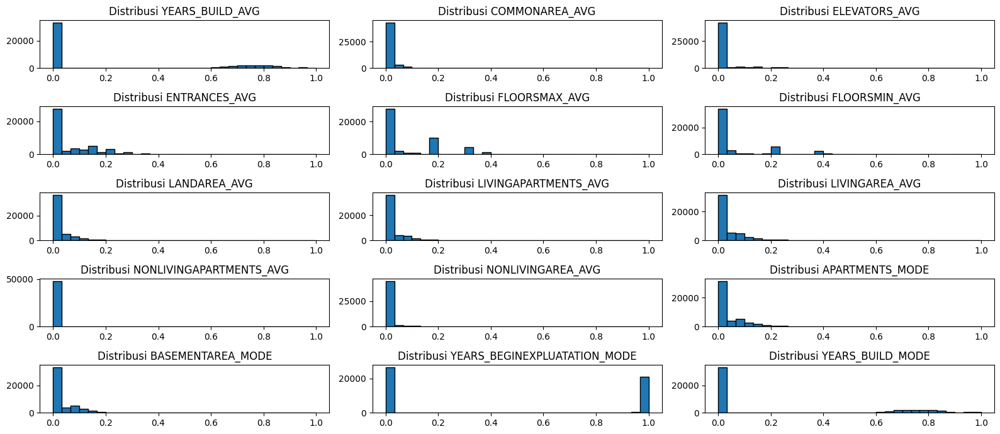

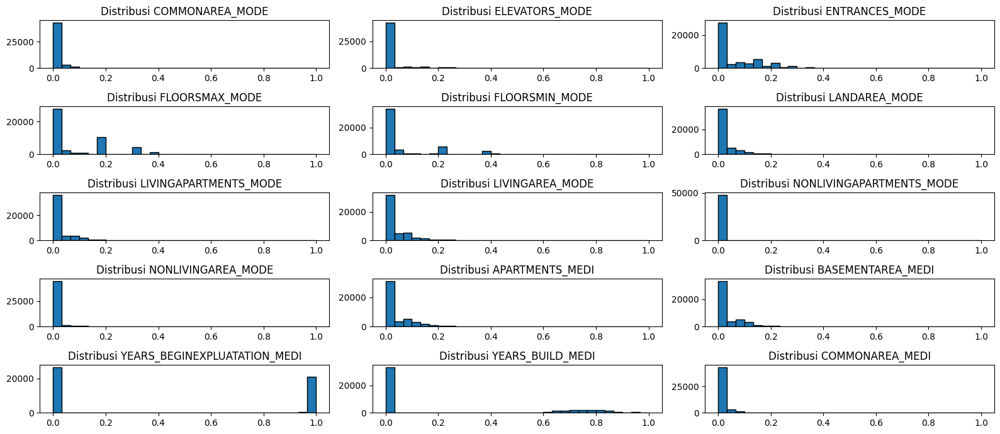

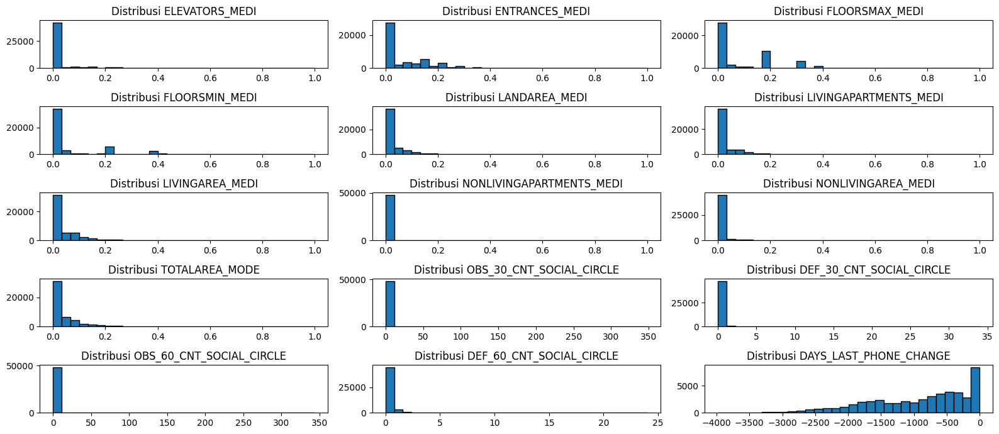

...

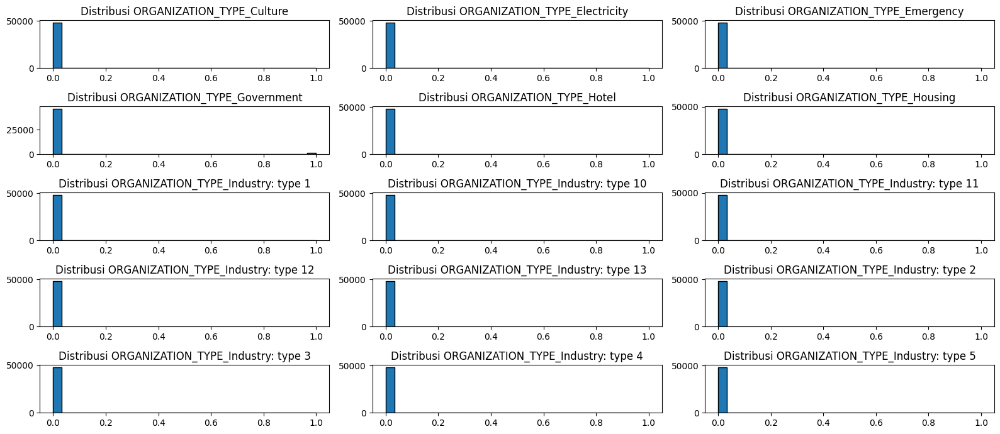

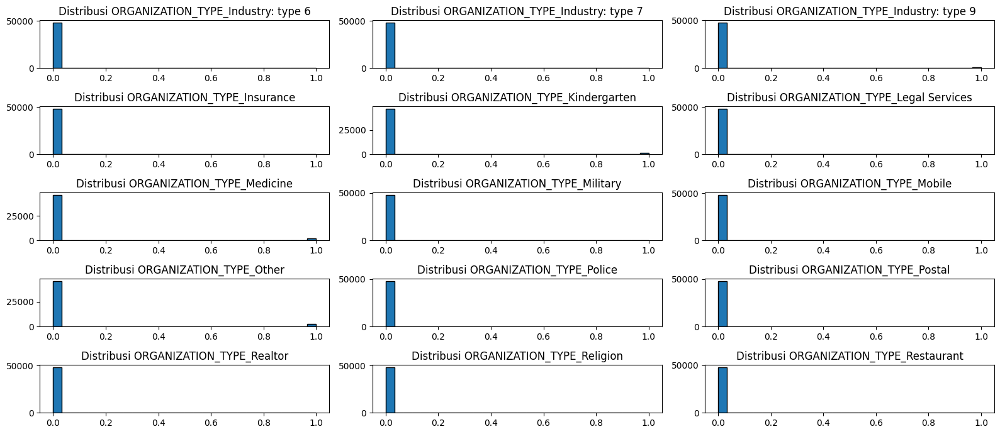

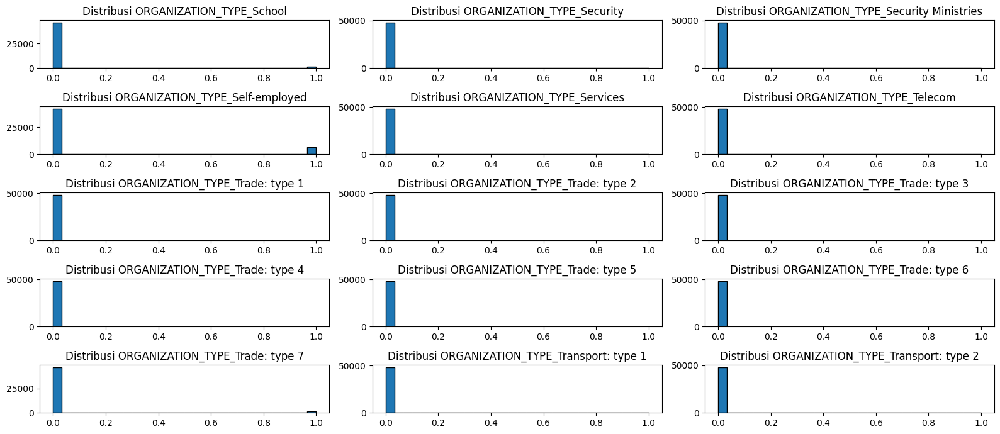

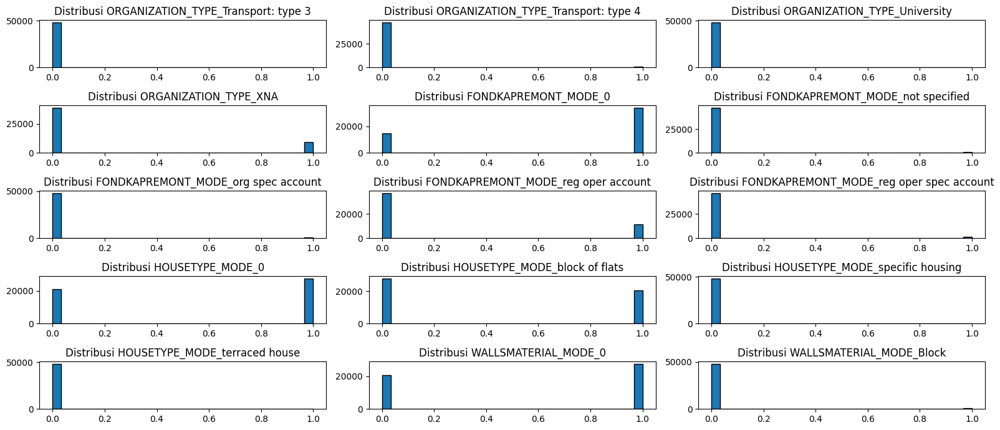

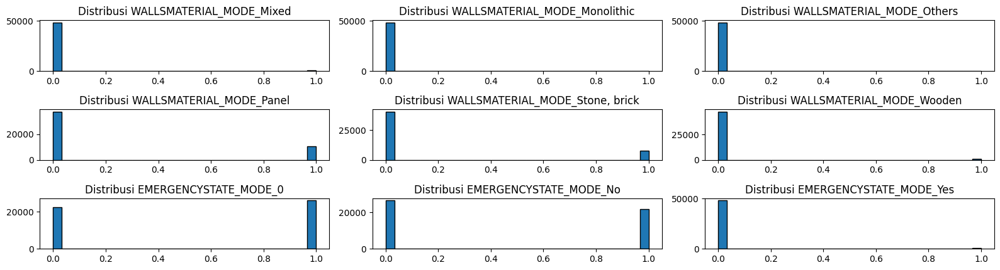

In [23]:
# Mendapatkan daftar fitur
features = df_filtered.columns.tolist()

# Mengatur jumlah subplot berdasarkan jumlah fitur
num_plots = len(features)
num_figures = num_plots // 15 + (num_plots % 15 > 0)

for j in range(num_figures):
    plt.figure(figsize=(16, 7))
    start = j * 15
    end = (j + 1) * 15 if (j + 1) * 15 < num_plots else num_plots
    for i in range(start, end):
        plt.subplot(5, 3, i - start + 1)
        feature = features[i]
        if df_filtered[feature].dtype == 'bool':
            plt.hist(df_filtered[feature].astype(int), bins=30, edgecolor='black')
        else:
            plt.hist(df_filtered[feature], bins=30, edgecolor='black')
        plt.title(f'Distribusi {feature}')
    plt.tight_layout()
    plt.show()


In [32]:
model = RandomForestClassifier()
model.fit(X_train, y_train)

RandomForestClassifier()

In [33]:
predictions = model.predict(X_test)
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.89      1.00      0.94      8613
           1       0.33      0.00      0.00      1053

    accuracy                           0.89      9666
   macro avg       0.61      0.50      0.47      9666
weighted avg       0.83      0.89      0.84      9666



In [34]:
from sklearn.metrics import mean_squared_error

# Mengevaluasi model
predictions = model.predict(X_test)
mse = mean_squared_error(y_test, predictions)

print(f'Mean Squared Error: {mse}')


Mean Squared Error: 0.10914545830746948


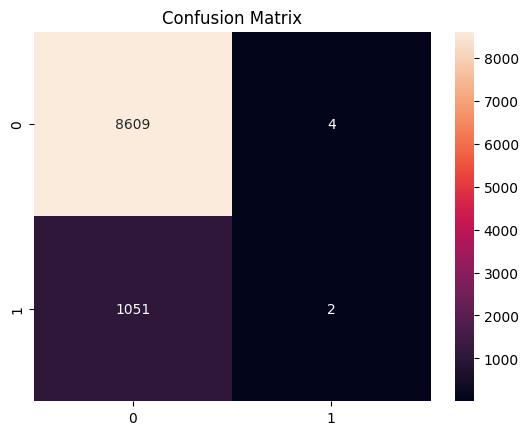

In [35]:
cm = confusion_matrix(y_test, predictions)
sns.heatmap(cm, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.show()

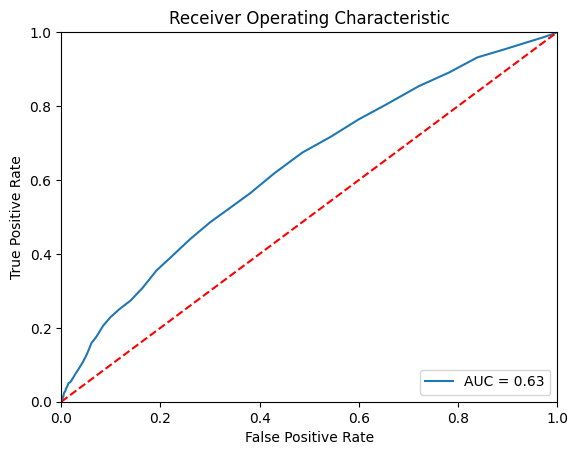

In [36]:
# Membuat plot ROC curve
probs = model.predict_proba(X_test)
probs = probs[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, probs)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label='AUC = %0.2f' % roc_auc)
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

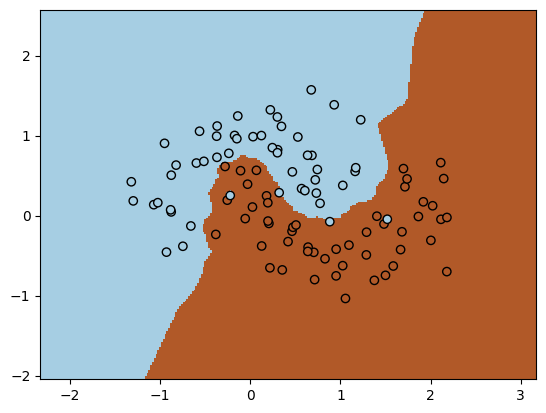

In [38]:
from sklearn.datasets import make_moons
from sklearn.neighbors import KNeighborsClassifier

X, y = make_moons(noise=0.3, random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

n_neighbors = 5
clf = KNeighborsClassifier(n_neighbors, weights='distance')
clf.fit(X_train, y_train)

x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02), np.arange(y_min, y_max, 0.02))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure()
plt.pcolormesh(xx, yy, Z, cmap=plt.cm.Paired)
plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', cmap=plt.cm.Paired)
plt.show()

In [39]:
# Untuk data numerik
df_numeric = df_filtered.select_dtypes(include=[np.number])

# Untuk data kategorikal
df_categorical = df.select_dtypes(include=[object])

In [40]:
df_halfclean = df.copy()

In [41]:
for col in df_categorical:
    if col in df_halfclean.columns:
        print(f'''Value count column {col}:''')
        print(df_halfclean[col].value_counts())
        print('---'*10, '\n')
    else:
        print(f"Kolom {col} tidak ada dalam df_halfclean.")

Value count column NAME_CONTRACT_TYPE:
NAME_CONTRACT_TYPE
Cash loans         278232
Revolving loans     29279
Name: count, dtype: int64
------------------------------ 

Value count column CODE_GENDER:
CODE_GENDER
F      202448
M      105059
XNA         4
Name: count, dtype: int64
------------------------------ 

Value count column FLAG_OWN_CAR:
FLAG_OWN_CAR
N    202924
Y    104587
Name: count, dtype: int64
------------------------------ 

Value count column FLAG_OWN_REALTY:
FLAG_OWN_REALTY
Y    213312
N     94199
Name: count, dtype: int64
------------------------------ 

Value count column NAME_TYPE_SUITE:
NAME_TYPE_SUITE
Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: count, dtype: int64
------------------------------ 

Value count column NAME_INCOME_TYPE:
NAME_INCOME_TYPE
Working                 158774
Commercial associate     71617
Pensioner    

In [42]:
df_filtered

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_11,FLAG_DOCUMENT_15,FLAG_DOCUMENT_17,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,CODE_GENDER_F,CODE_GENDER_M,CODE_GENDER_XNA,FLAG_OWN_CAR_N,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_N,FLAG_OWN_REALTY_Y,NAME_TYPE_SUITE_0,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_0,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYP

In [43]:
df_filtered[df_numeric.columns].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
SK_ID_CURR,48330.0,2.778175e+05,102771.445181,100010.000000,188581.750000,276671.000000,366864.750000,4.562530e+05
TARGET,48330.0,-2.881572e-17,1.000010,-0.353405,-0.353405,-0.353405,-0.353405,2.829613e+00
CNT_CHILDREN,48330.0,4.641630e-01,0.756693,0.000000,0.000000,0.000000,1.000000,1.000000e+01
AMT_INCOME_TOTAL,48330.0,1.521949e+05,84345.765941,26100.000000,99000.000000,135000.000000,180000.000000,2.930026e+06
AMT_CREDIT,48330.0,5.735832e+05,379001.355787,45000.000000,270000.000000,497520.000000,782115.750000,3.375000e+06
AMT_ANNUITY,48330.0,2.605341e+04,13462.026493,2187.000000,16164.000000,24259.500000,33007.500000,2.250000e+05
AMT_GOODS_PRICE,48330.0,5.080792e+05,342622.404424,0.000000,229500.000000,450000.000000,675000.000000,3.375000e+06
REGION_POPULATION_RELATIVE,48330.0,1.382961e-02,0.006779,0.000533,0.006852,0.018029,0.020246,2.071300e-02
DAYS_BIRTH,48330.0,-1.592594e+04,4413.687821,-25201.000000,-19697.000000,-15549.500000,-12163.000000,-7.678000e+03
DAYS_EMPLOYED,48330.0,6.877961e+04,145280.439161,-17531.000000,-2713.750000,-1191.000000,-266.000000,3.652430e+05


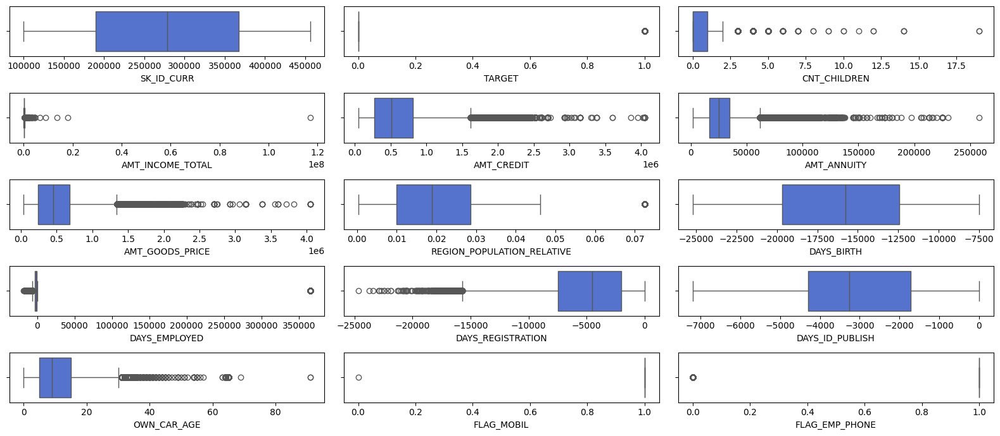

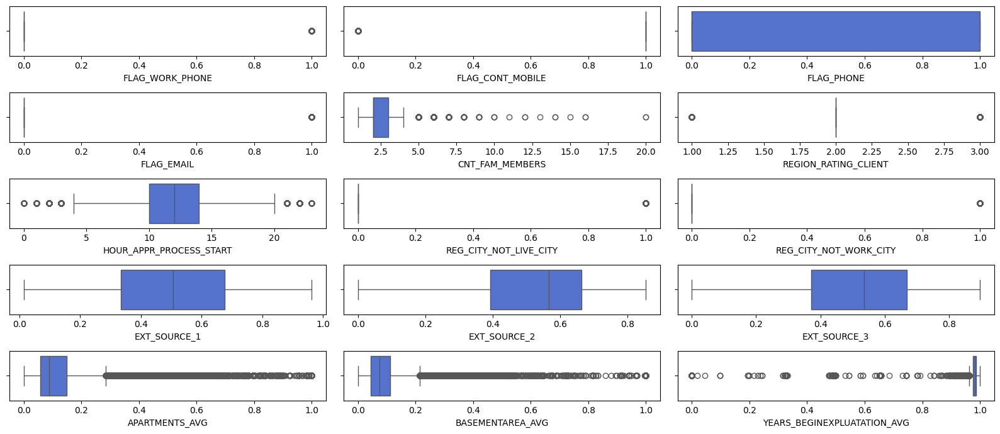

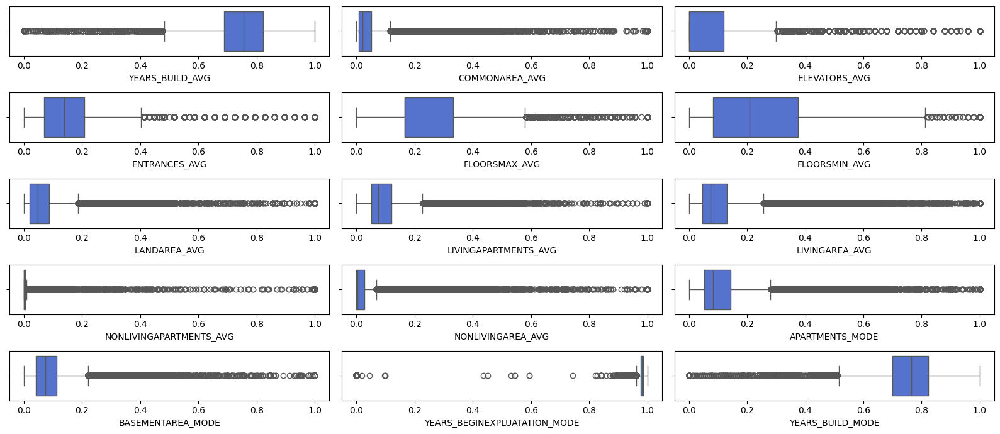

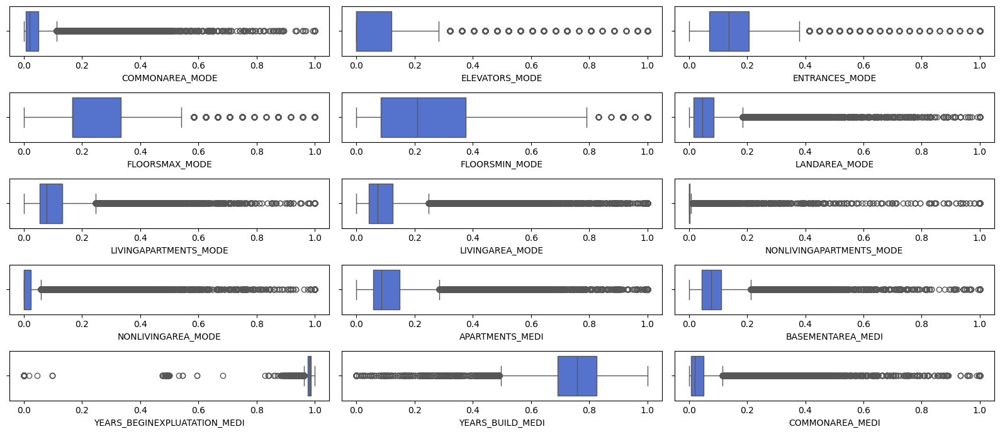

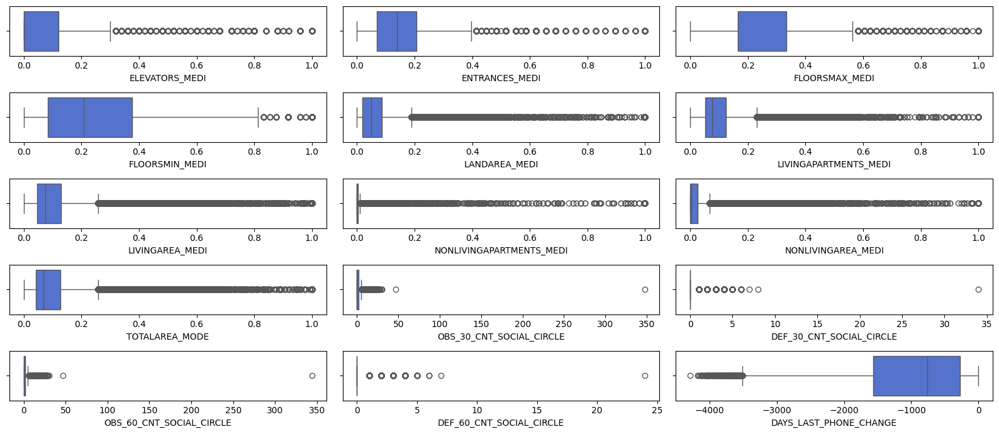

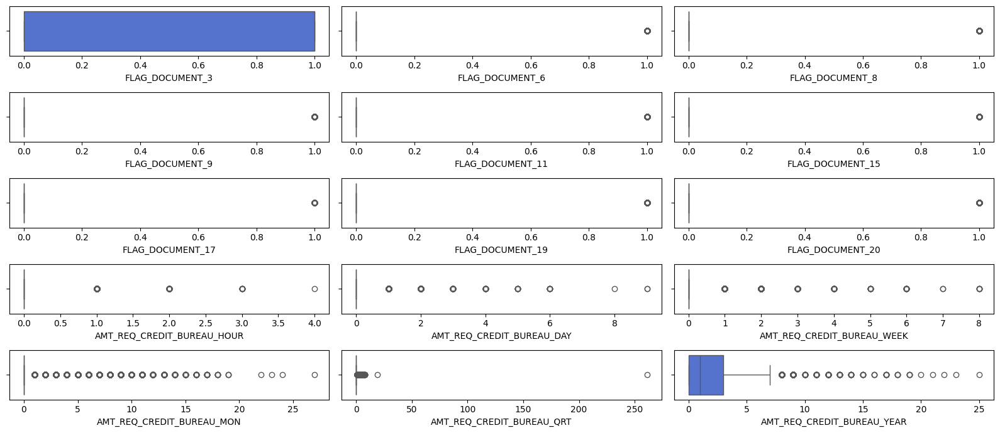

In [44]:
df_numeric_sample = df_numeric.head(105)
num_plots = len(df_numeric_sample.columns)
num_figures = num_plots // 15 + (num_plots % 15 > 0)

for j in range(num_figures):
    plt.figure(figsize=(16, 7))
    start = j * 15
    end = (j + 1) * 15 if (j + 1) * 15 < num_plots else num_plots
    for i in range(start, end):
        plt.subplot(5, 3, i - start + 1)
        sns.boxplot(x=df_halfclean[df_numeric_sample.columns[i]], color='royalblue')
        plt.xlabel(df_numeric_sample.columns[i])
    plt.tight_layout()
    plt.show()

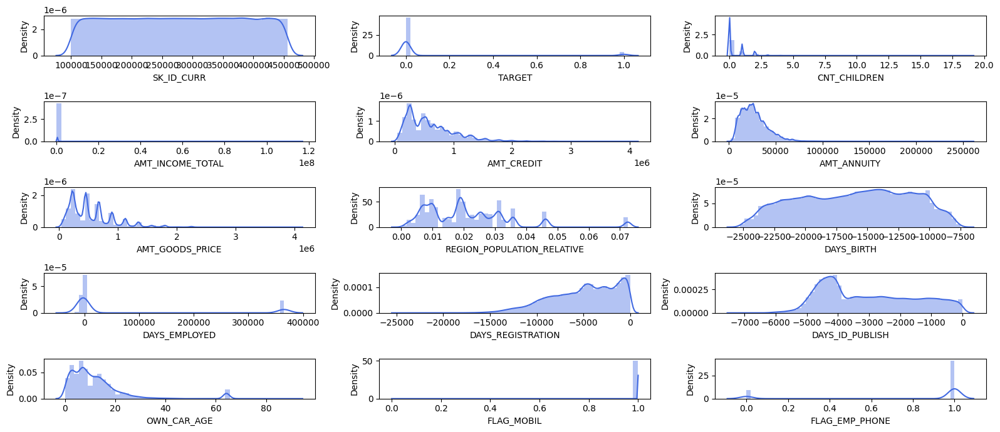

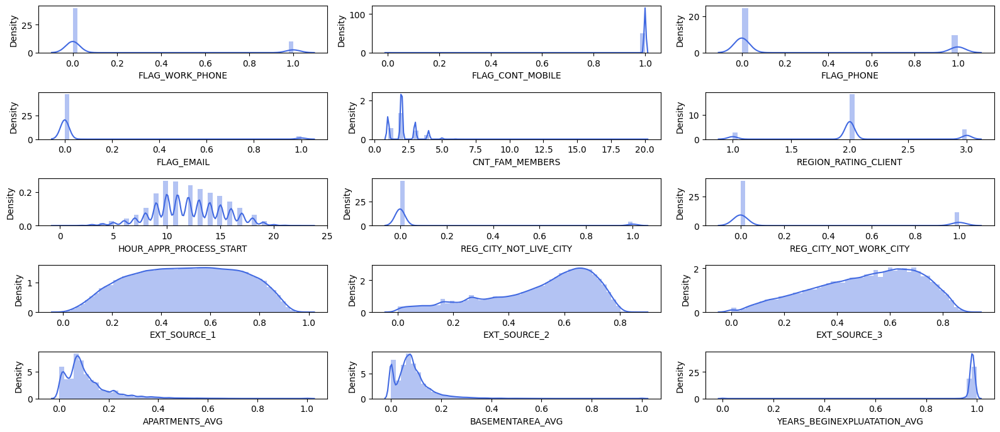

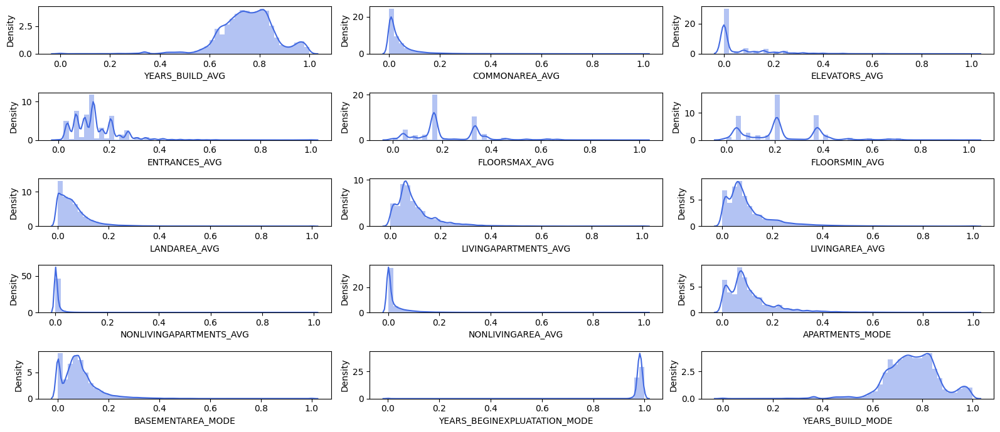

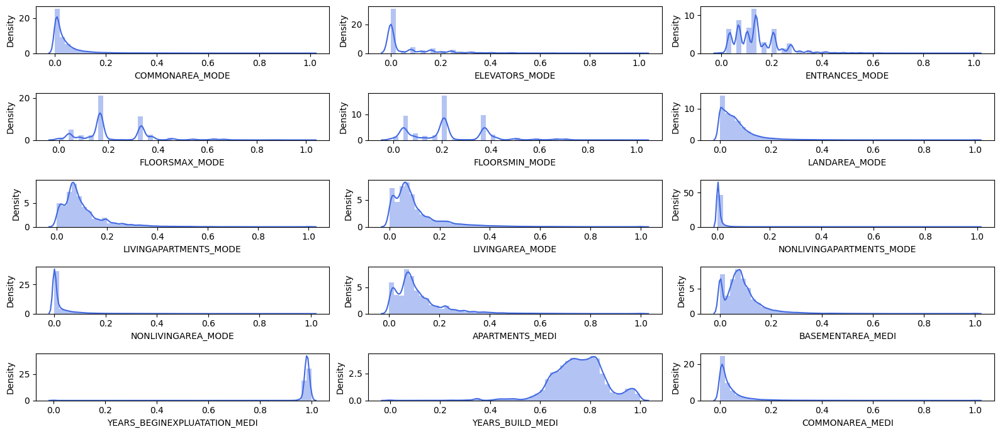

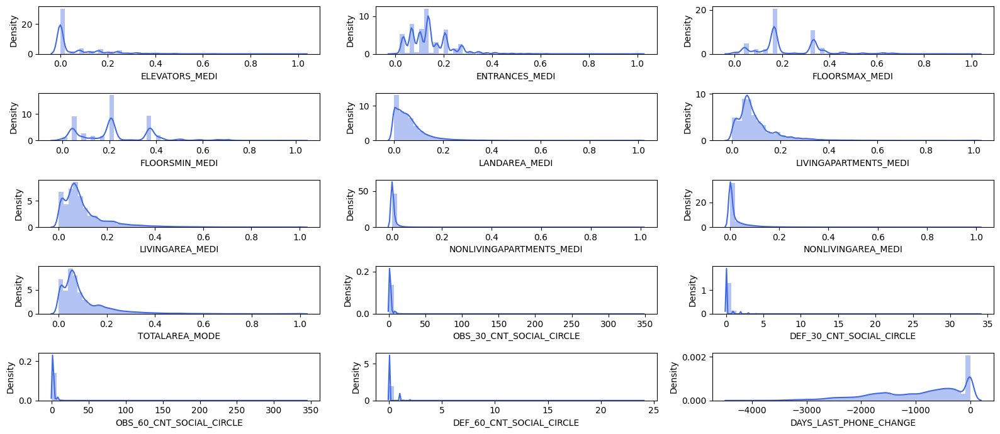

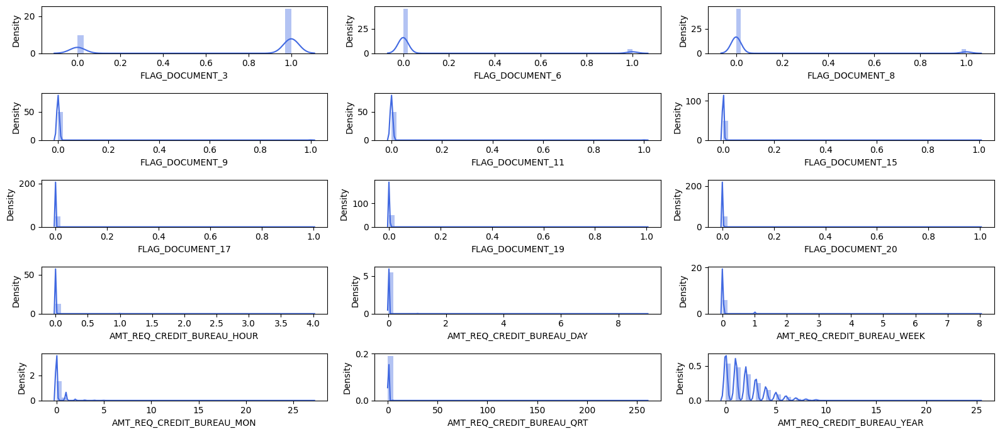

In [45]:
df_numeric_sample = df_numeric.head(105)
num_plots = len(df_numeric_sample.columns)
num_figures = num_plots // 15 + (num_plots % 15 > 0)

for j in range(num_figures):
    plt.figure(figsize=(16, 7))
    start = j * 15
    end = (j + 1) * 15 if (j + 1) * 15 < num_plots else num_plots
    for i in range(start, end):
        plt.subplot(5, 3, i - start + 1)
        sns.distplot(x=df_halfclean[df_numeric_sample.columns[i]], color='royalblue')
        plt.xlabel(df_numeric_sample.columns[i])
    plt.tight_layout()
    plt.show()

In [46]:
df_clean = df_filtered.copy()

In [47]:
# Remove Outliers
print(f'# Row before handling outliers: {len(df)}')

filtered_entries = np.array([True] * len(df_clean))
for col in df_clean[df_numeric.columns.tolist()].columns:
    Q1 = df_clean[col].quantile(0.25)
    Q3 = df_clean[col].quantile(0.75)
    IQR = Q3 - Q1
    low_limit = Q1 - 1.5 * IQR
    high_limit = Q3 + 1.5 * IQR
    filtered_entries = ((df_clean[col] >= low_limit) & (df_clean[col] <= high_limit)) & filtered_entries

df_clean_IQR = df_clean[filtered_entries]
print(f'# Row after handling outliers: {len(df_clean_IQR)}')

# Row before handling outliers: 307511
# Row after handling outliers: 3274


In [48]:
df_clean_IQR[df_numeric.columns.tolist()].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
SK_ID_CURR,3274.0,276920.311851,1.035697e+05,100318.000000,187622.000000,276806.500000,364861.250000,4.562140e+05
TARGET,3274.0,-0.353405,4.941247e-15,-0.353405,-0.353405,-0.353405,-0.353405,-3.534052e-01
CNT_CHILDREN,3274.0,0.551008,7.202670e-01,0.000000,0.000000,0.000000,1.000000,2.000000e+00
AMT_INCOME_TOTAL,3274.0,134995.266341,5.265851e+04,27000.000000,90000.000000,135000.000000,162000.000000,2.925000e+05
AMT_CREDIT,3274.0,513578.229383,3.088304e+05,50940.000000,269662.500000,450000.000000,703118.250000,1.540305e+06
AMT_ANNUITY,3274.0,23931.092089,1.091353e+04,3577.500000,15468.750000,22783.500000,31239.000000,5.818950e+04
AMT_GOODS_PRICE,3274.0,446132.457544,2.682159e+05,45000.000000,225000.000000,405000.000000,673875.000000,1.327500e+06
REGION_POPULATION_RELATIVE,3274.0,0.012869,6.946153e-03,0.000938,0.006305,0.018029,0.020246,2.071300e-02
DAYS_BIRTH,3274.0,-14551.249542,3.582878e+03,-24875.000000,-17226.750000,-14328.500000,-11630.500000,-7.686000e+03
DAYS_EMPLOYED,3274.0,-1985.171961,1.476859e+03,-6381.000000,-2895.750000,-1584.000000,-812.000000,-1.600000e+01


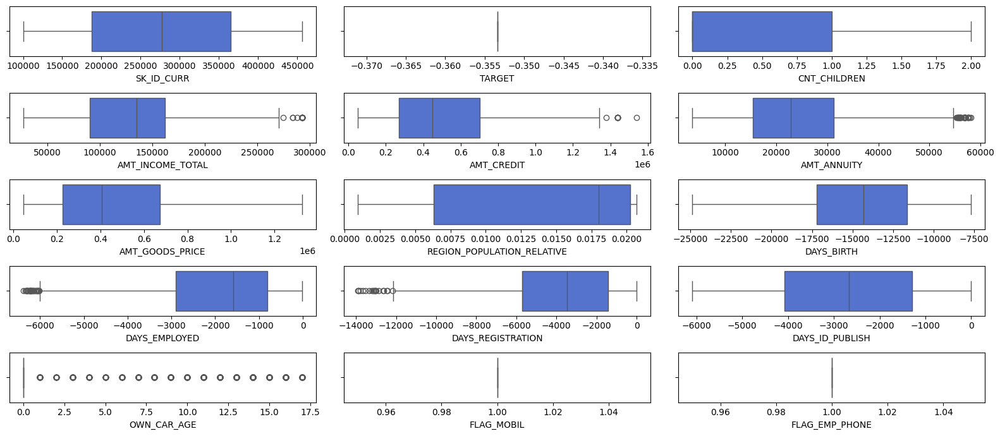

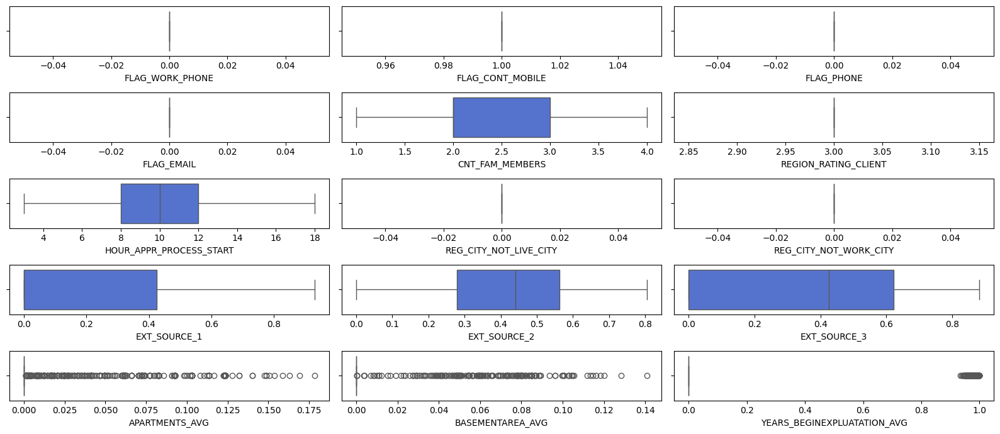

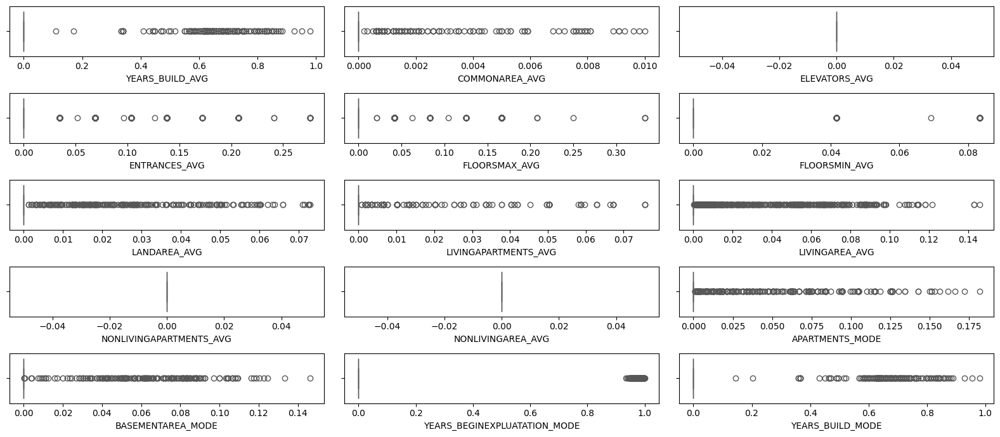

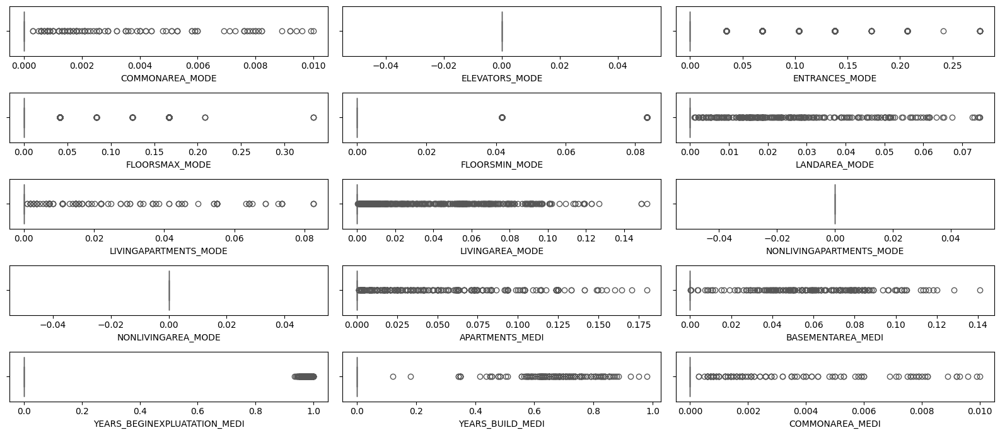

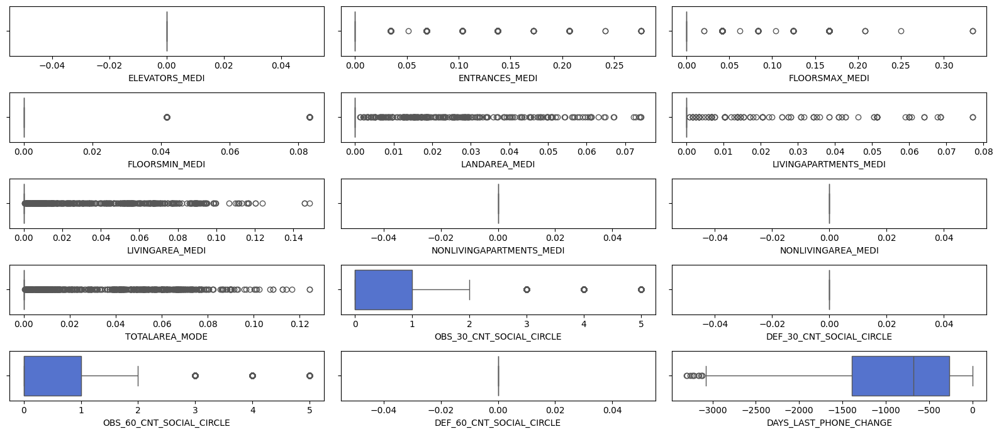

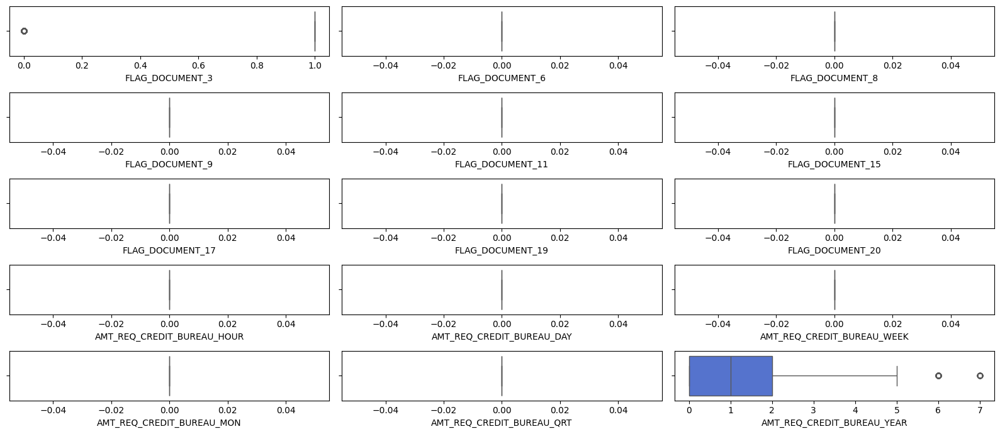

In [49]:
df_numeric_sample = df_numeric.head(105)
num_plots = len(df_numeric_sample.columns)
num_figures = num_plots // 15 + (num_plots % 15 > 0)

for j in range(num_figures):
    plt.figure(figsize=(16, 7))
    start = j * 15
    end = (j + 1) * 15 if (j + 1) * 15 < num_plots else num_plots
    for i in range(start, end):
        plt.subplot(5, 3, i - start + 1)
        sns.boxplot(x=df_clean_IQR[df_numeric_sample.columns[i]], color='royalblue')
        plt.xlabel(df_numeric_sample.columns[i])
    plt.tight_layout()
    plt.show()


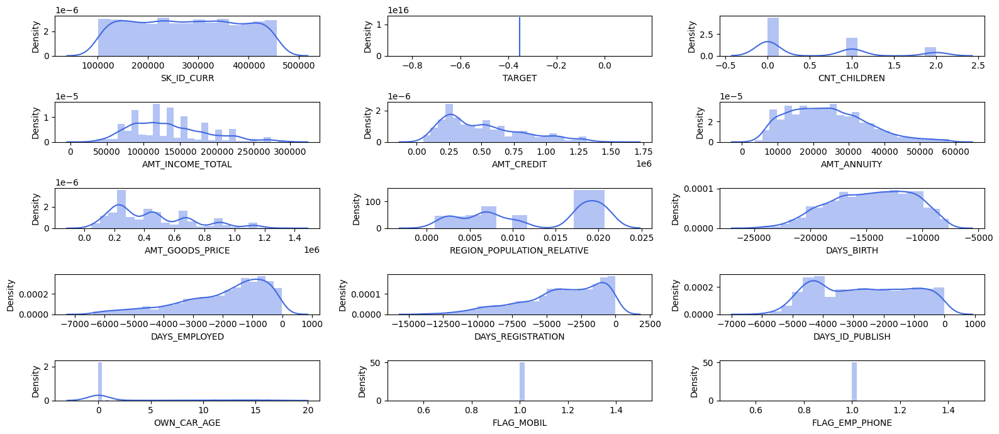

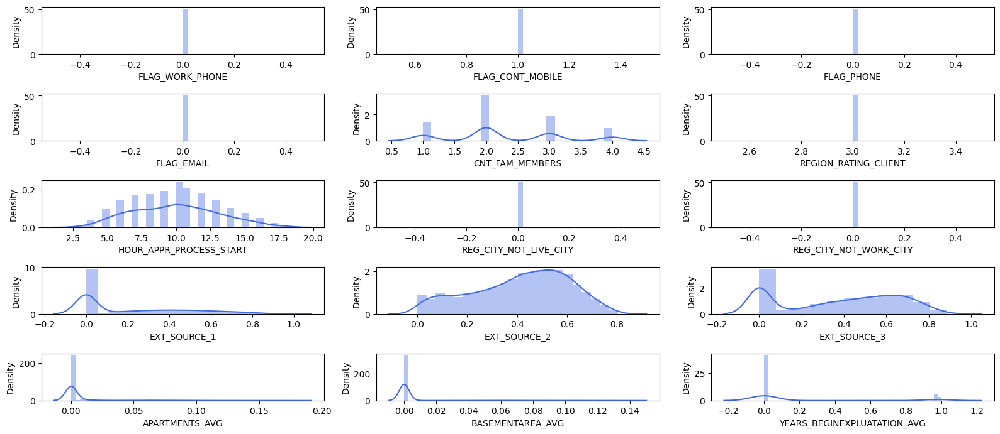

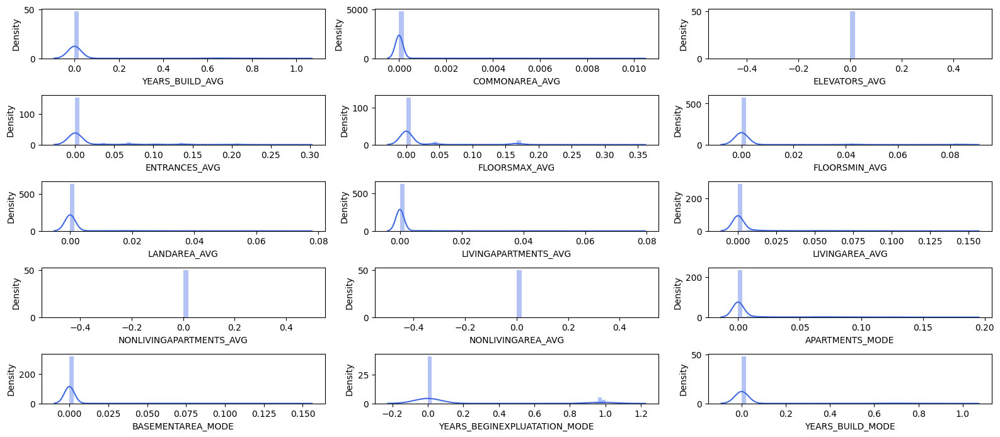

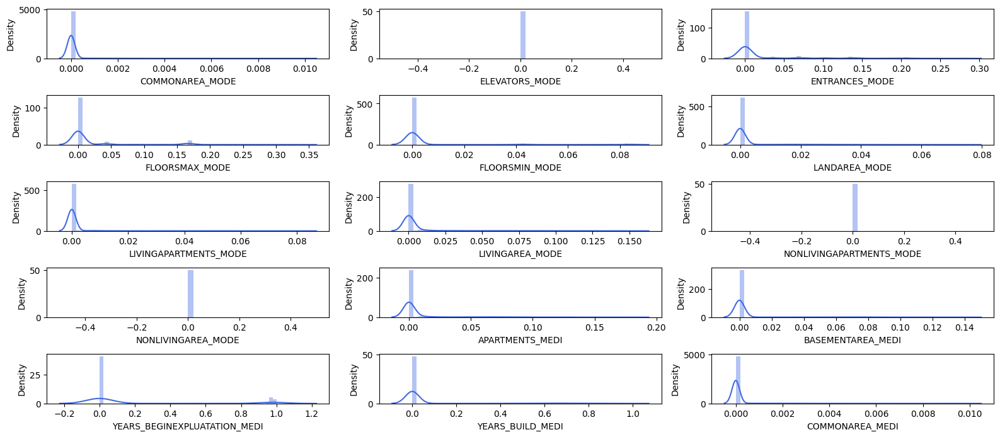

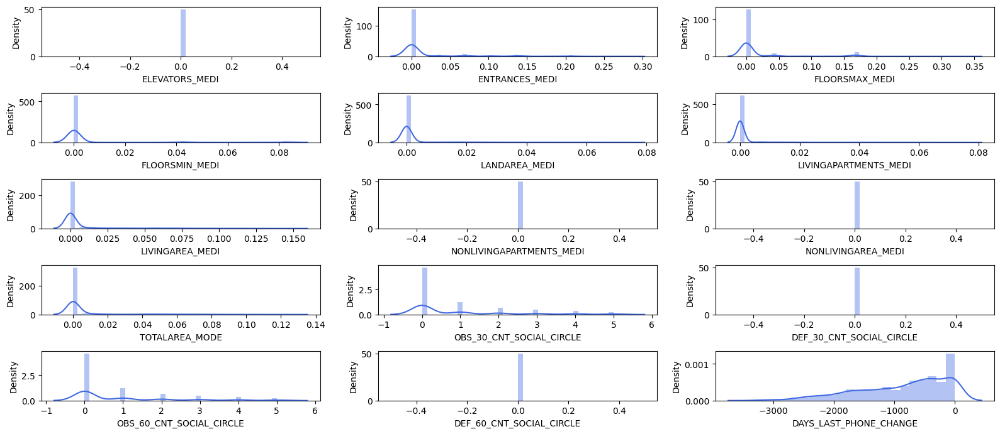

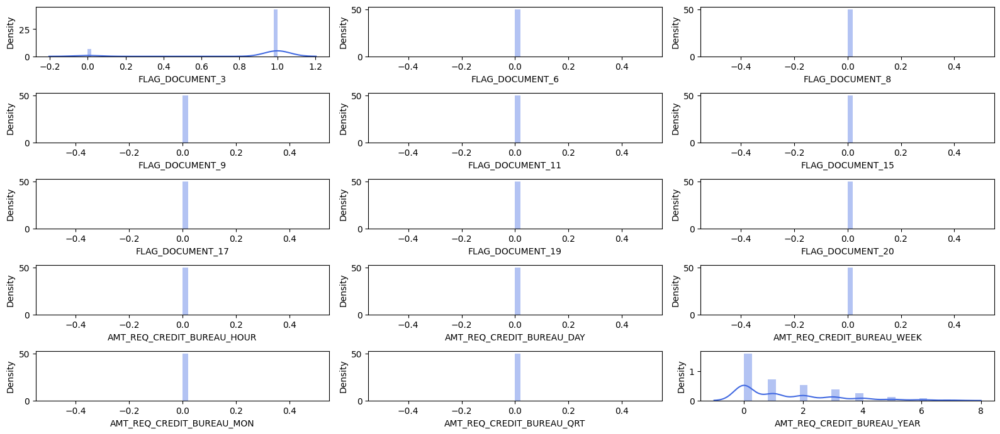

In [50]:
df_numeric_sample = df_numeric.head(105)
num_plots = len(df_numeric_sample.columns)
num_figures = num_plots // 15 + (num_plots % 15 > 0)

for j in range(num_figures):
    plt.figure(figsize=(16, 7))
    start = j * 15
    end = (j + 1) * 15 if (j + 1) * 15 < num_plots else num_plots
    for i in range(start, end):
        plt.subplot(5, 3, i - start + 1)
        sns.distplot(x=df_clean_IQR[df_numeric_sample.columns[i]], color='royalblue')
        plt.xlabel(df_numeric_sample.columns[i])
    plt.tight_layout()
    plt.show()

In [51]:
df_percentage = df.groupby('TARGET').agg(Population = ('TARGET','count'))
df_percentage.reset_index(inplace=True)

df_percentage['%TARGET'] = round(100 * df_percentage['Population']/df_percentage['Population'].sum(), 2)

df_percentage

,TARGET,Population,%TARGET
0,0,282686,91.93
1,1,24825,8.07


In [52]:
df_percentageclean = df_clean_IQR.groupby('TARGET').agg(Population = ('TARGET','count'))
df_percentageclean.reset_index(inplace=True)

df_percentageclean['%TARGET'] = round(100 * df_percentageclean['Population']/df_percentageclean['Population'].sum(), 2)

# Compare Churn Rate before & after data cleaning
count_target = df_percentage['Population']
count_targetclean = df_percentageclean['Population']

percent_target = df_percentage['%TARGET'][0]
percent_targetclean = df_percentageclean['%TARGET'][0]

print('Target % before data cleaning :' , percent_target, "%", 'from total rows', len(df))
print(count_target)
print('\n')

print('Target % after data cleaning :' , percent_targetclean, "%", 'from total rows', len(df_clean_IQR))
print(count_targetclean)
print('\n')

Target % before data cleaning : 91.93 % from total rows 307511
0    282686
1     24825
Name: Population, dtype: int64


Target % after data cleaning : 100.0 % from total rows 3274
0    3274
Name: Population, dtype: int64




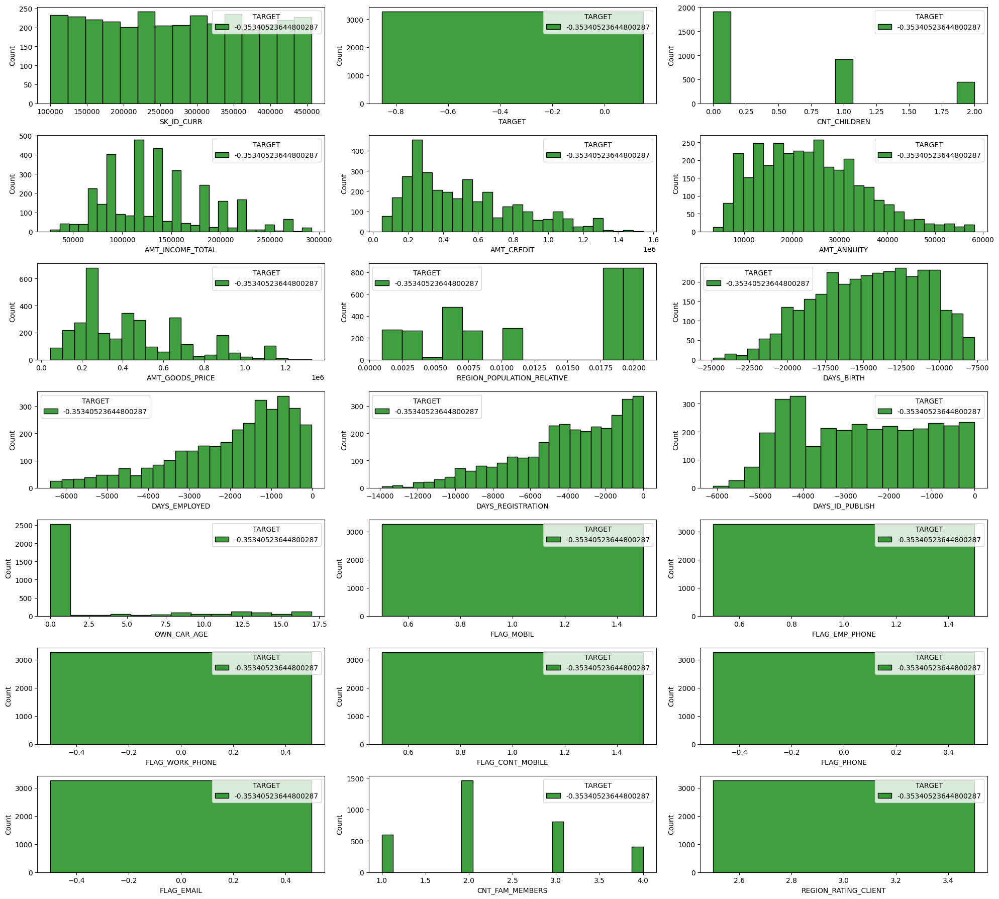

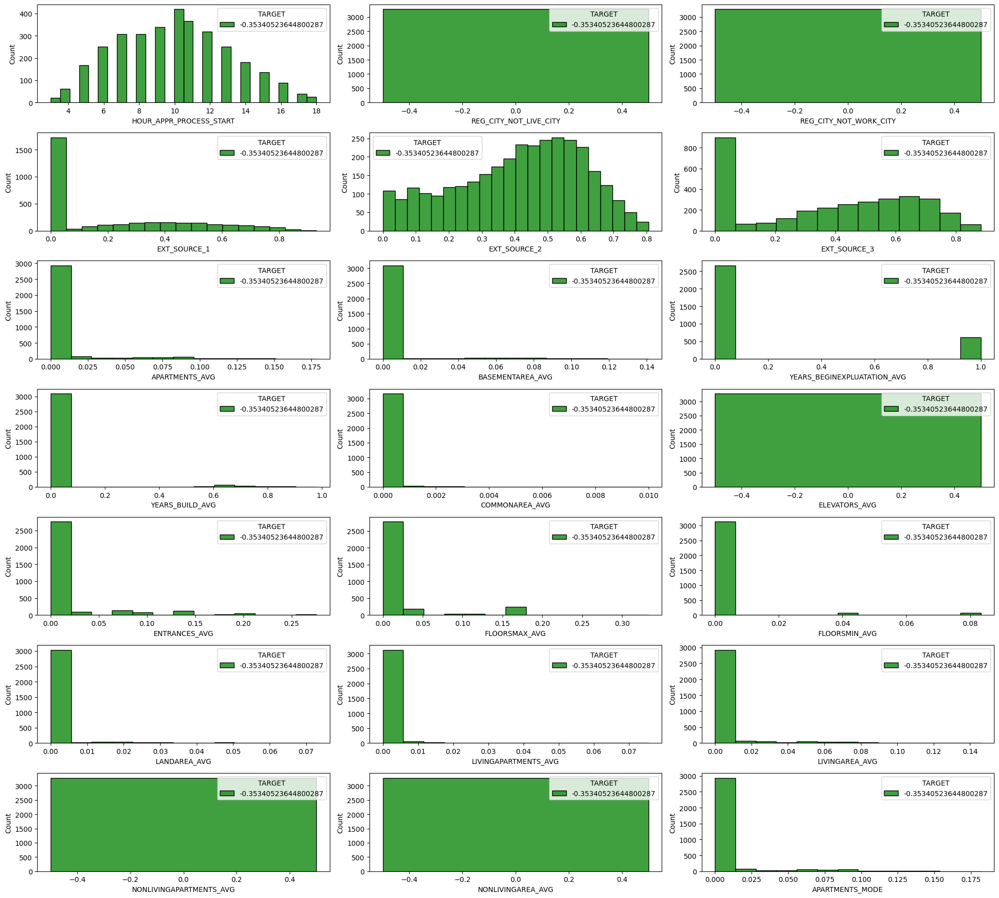

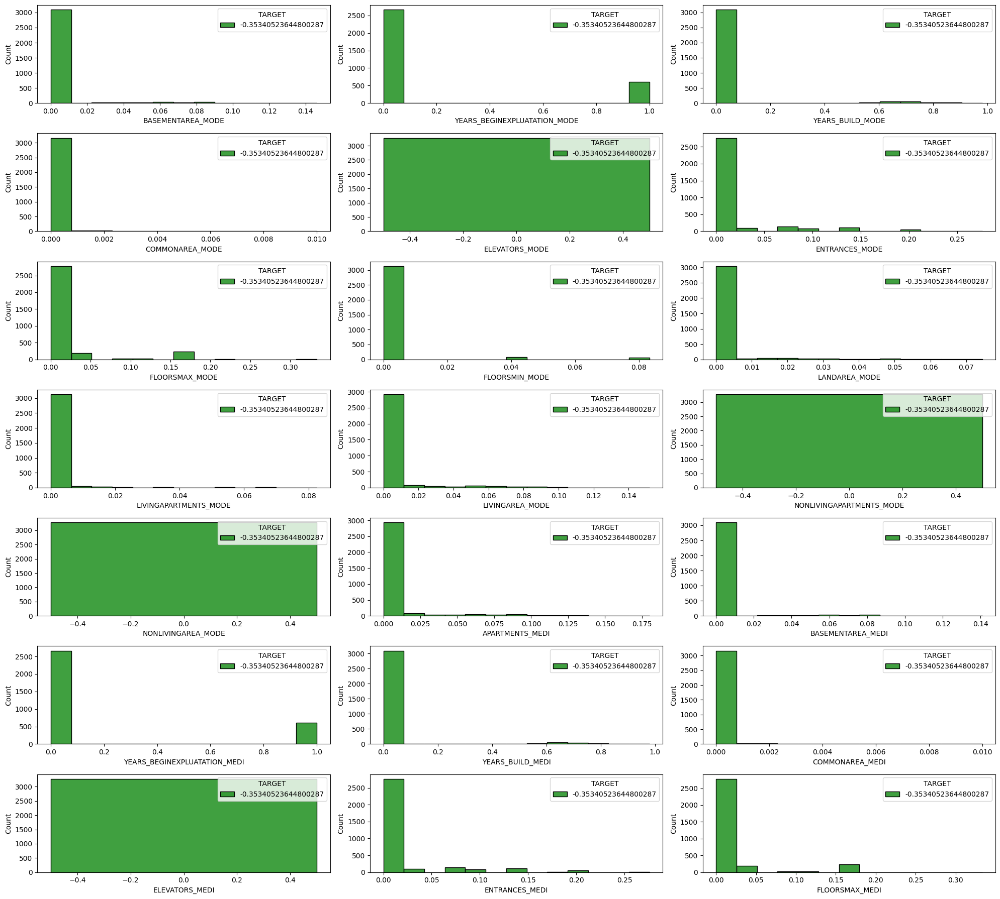

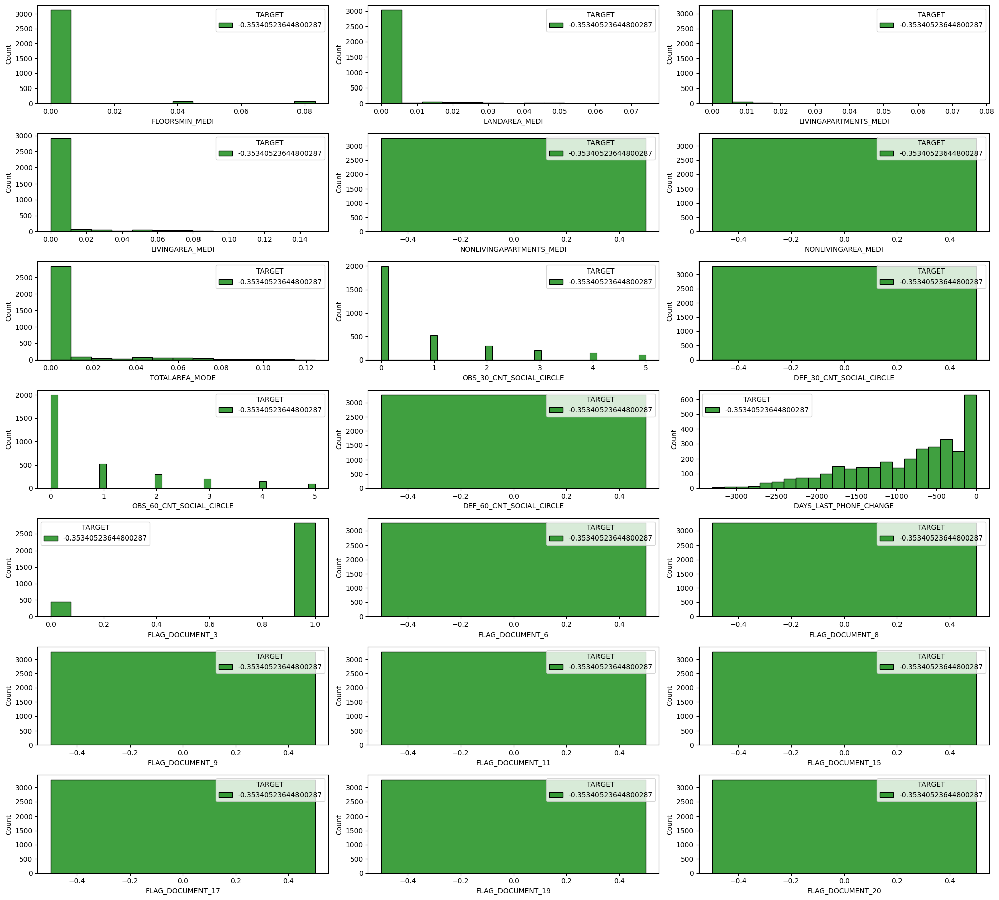

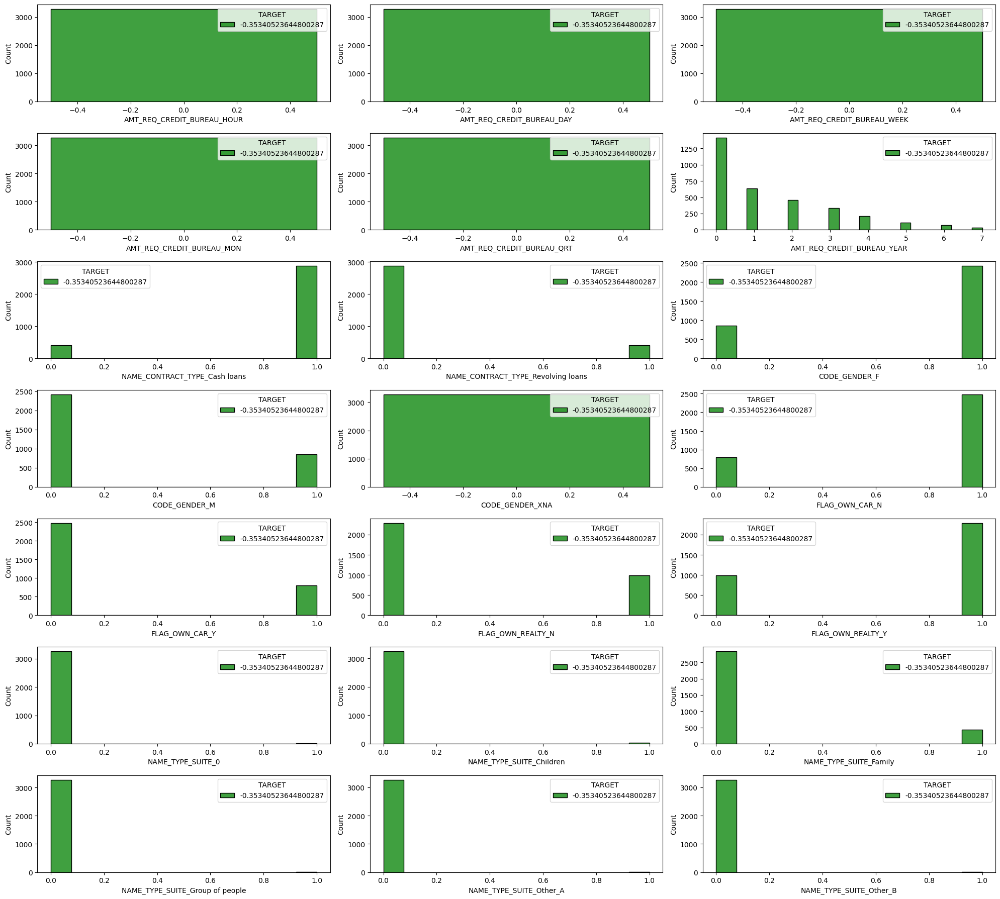

...

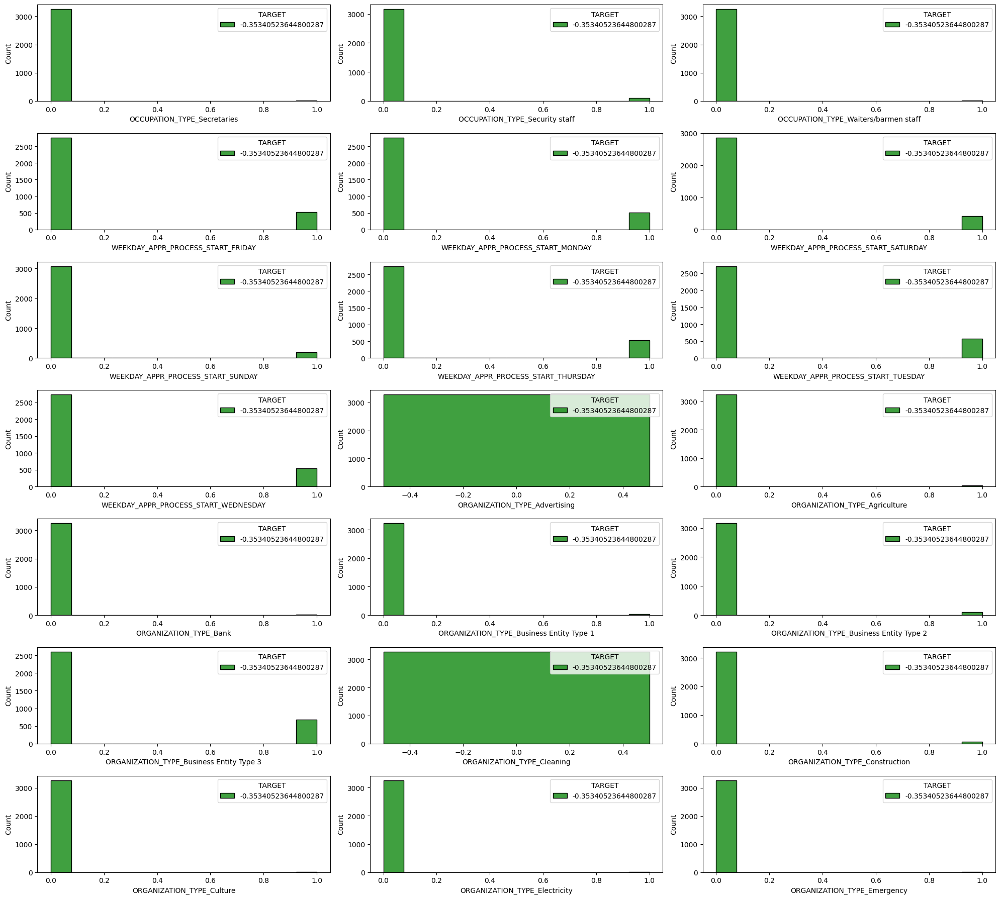

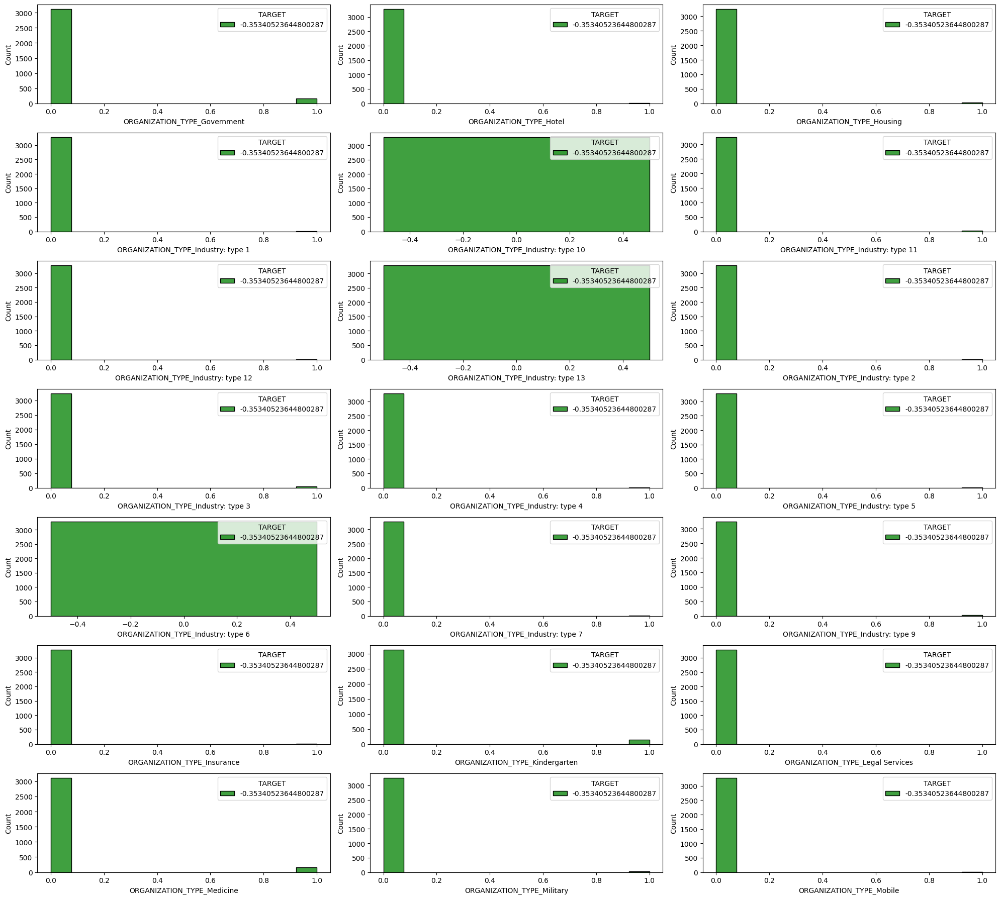

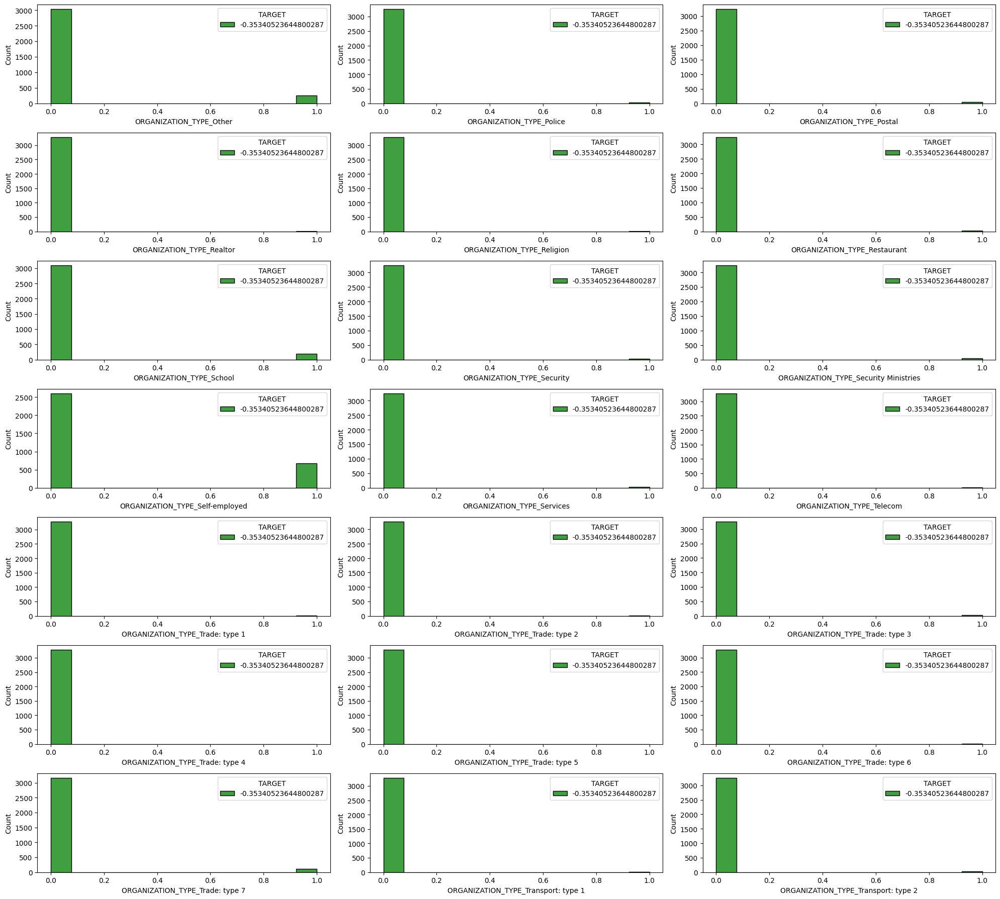

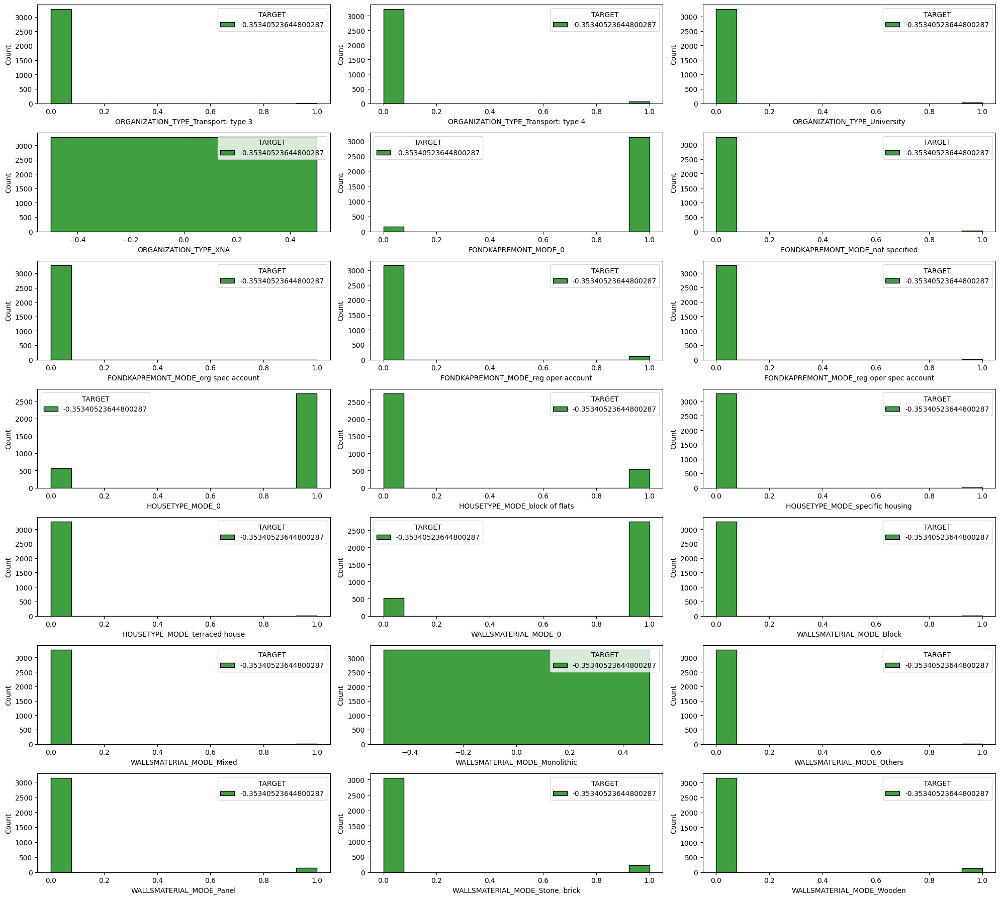

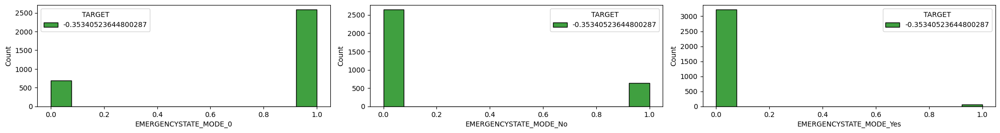

In [60]:
num_plots = len(df_clean_IQR[df_numeric+df_categorical].columns)
num_figures = num_plots // 21 + (num_plots % 21 > 0)

for j in range(num_figures):
    plt.figure(figsize=(20, 18))
    start = j * 21
    end = (j + 1) * 21 if (j + 1) * 21 < num_plots else num_plots
    for i, col in enumerate(df_clean_IQR[df_numeric+df_categorical].columns[start:end]):
        plt.subplot(7, 3, i+1)
        ax = sns.histplot(x=df_clean_IQR[col], hue=df_clean_IQR['TARGET'], data=df_clean_IQR, palette='ocean', multiple='stack')
    plt.tight_layout()
    plt.show()

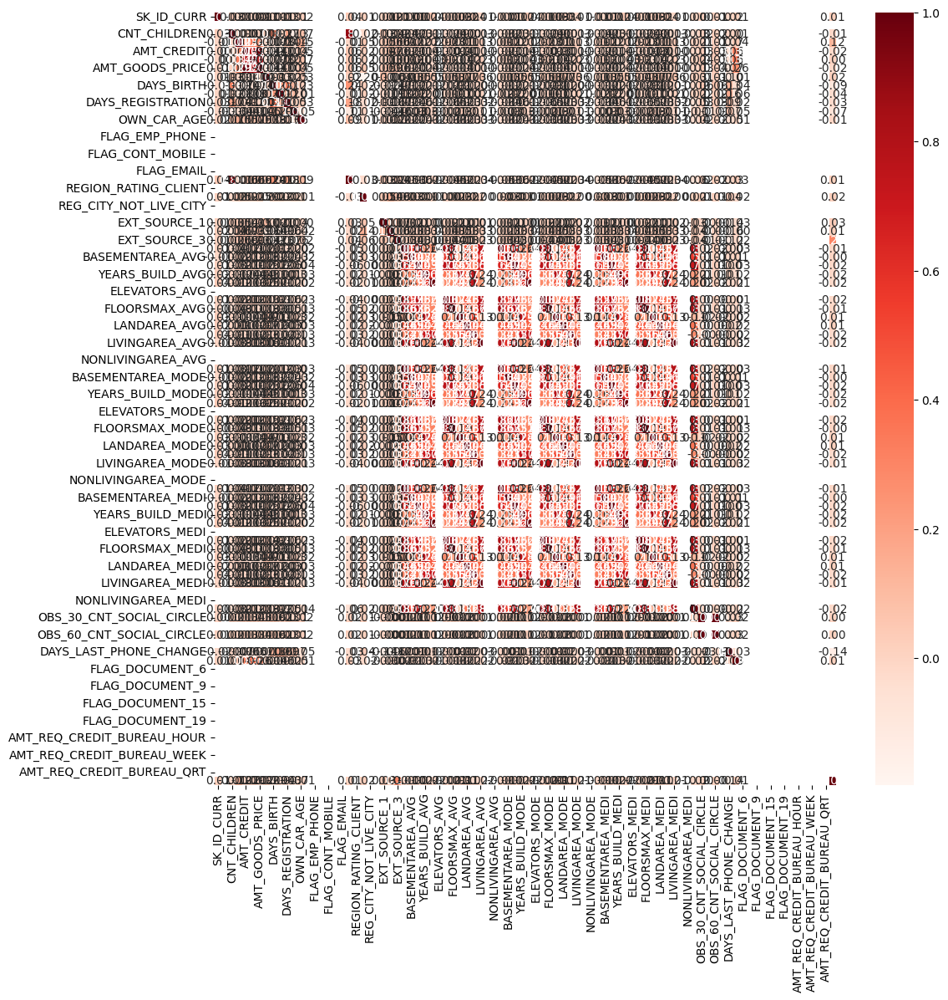

In [61]:
# Pilih hanya kolom numerik
df_numeric = df_clean_IQR.select_dtypes(include=[np.number])

# Hitung dan plot heatmap korelasi
plt.figure(figsize=(12, 12))
sns.heatmap(df_numeric.corr(), annot=True, fmt='.2f', cmap='Reds')
plt.show()

In [93]:
dfzg=dfz.groupby(['Segmentation','TARGET']).agg({'SK_ID_CURR':'nunique'}).reset_index().rename(columns={'SK_ID_CURR':'Total'})
dfzg

,Segmentation,TARGET,Total
0,high,-0.353405,3274


In [56]:
#dari hasil analisis yang dilakukan didapatkan sekitar 3274 target nasabah yang 
#sangat berpeluang lancar dalam melakukan transaki dan membayar tepat waktu
# nilai -0.353405 merupakan hasil analisis yang menunjukkan segmentation high atau tinggi dalam melakukan transasi

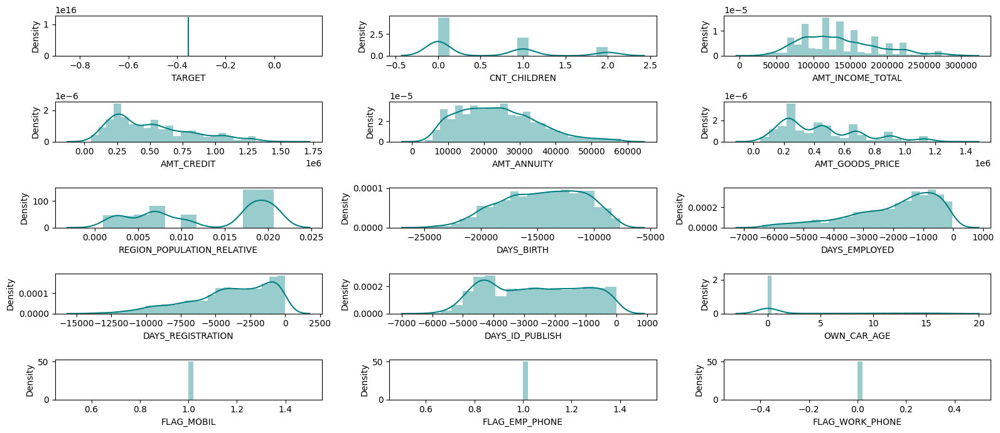

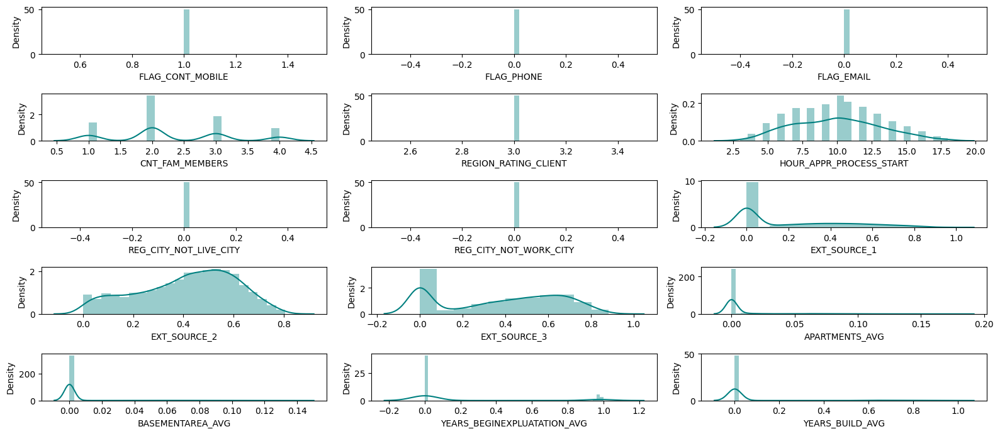

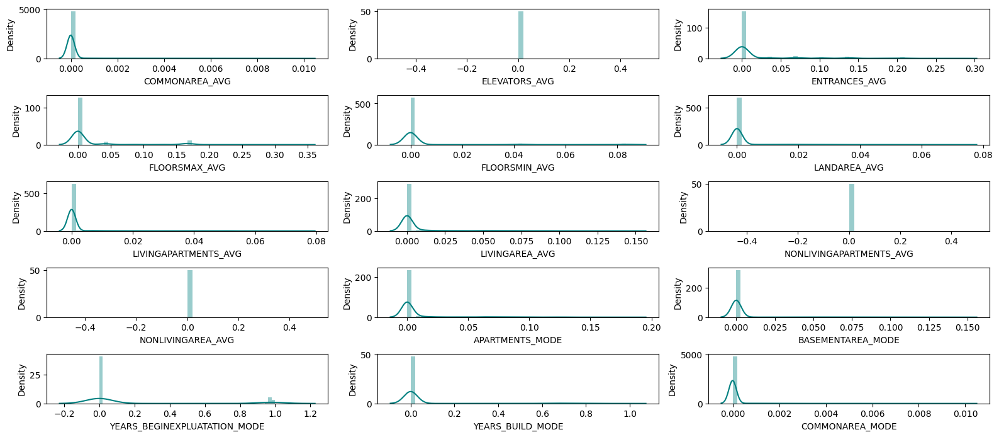

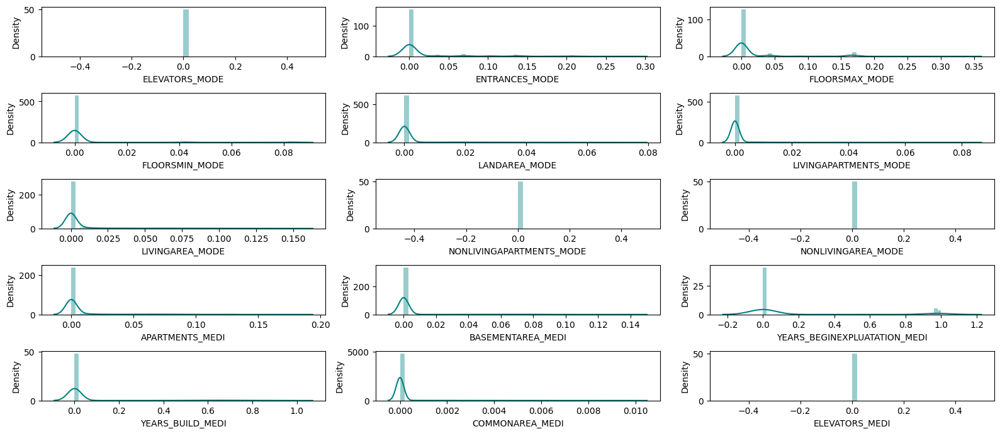

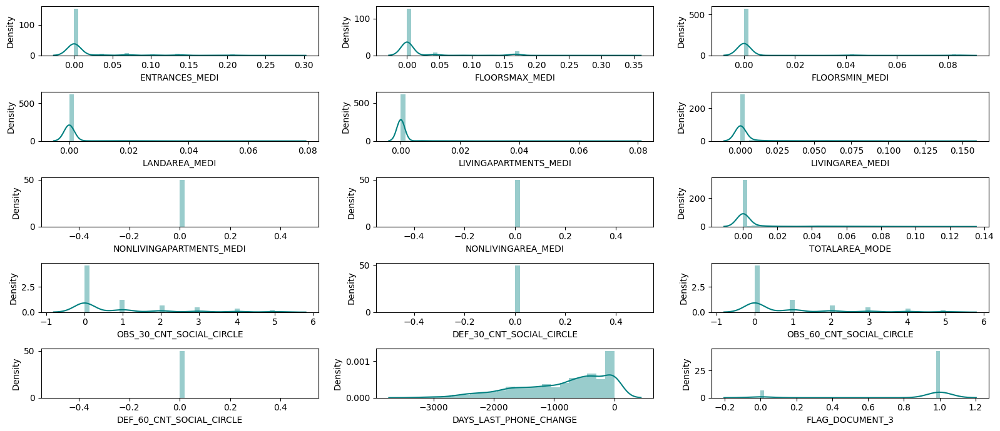

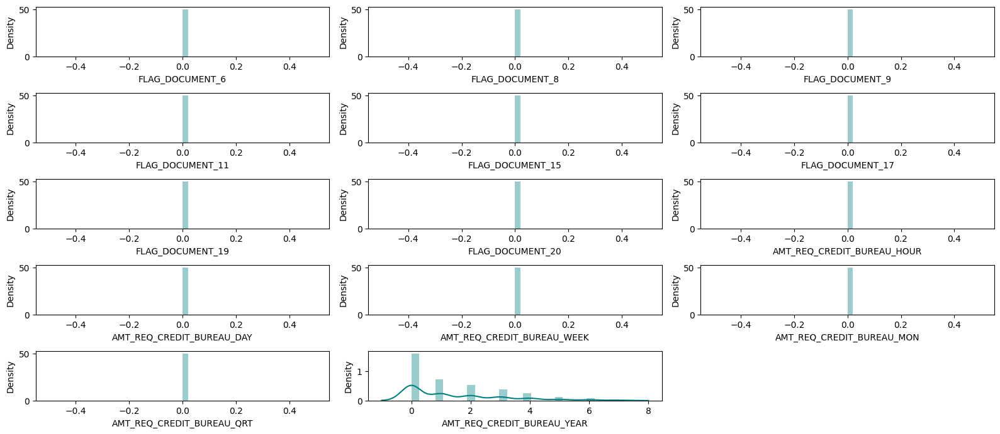

In [94]:
# Membuat list kolom tanpa 'SK_ID_CURR'
df_numeric_columns = df_numeric.columns.tolist()
if 'SK_ID_CURR' in df_numeric_columns:
    df_numeric_columns.remove('SK_ID_CURR')

num_plots = len(df_numeric_columns)
num_figures = num_plots // 15 + (num_plots % 15 > 0)

for j in range(num_figures):
    plt.figure(figsize=(16, 7))
    start = j * 15
    end = (j + 1) * 15 if (j + 1) * 15 < num_plots else num_plots
    for i in range(start, end):
        plt.subplot(5, 3, i - start + 1)
        sns.distplot(x=dfclean[df_numeric_columns[i]], color='teal')
        plt.xlabel(df_numeric_columns[i])
    plt.tight_layout()
    plt.show()